### Objective: To train Regression models for Heparin RRT with data from multiple antibodies. 
In this notebook, I am training models to predict Heparin Relative Retention Times, using a pipeline that I previously wrote. It works well. 


In [1]:
import mlflow
from mlflow.models import infer_signature

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from developability import data as data_

from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, average_precision_score, roc_auc_score, accuracy_score, f1_score    
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import Lasso, Ridge, ElasticNet, LinearRegression
from sklearn.model_selection import GridSearchCV, RepeatedKFold
from sklearn.neighbors import KNeighborsRegressor

from tqdm.notebook import tqdm
import tempfile

from developability.utils import ls
from developability.modeling import  *

## retina display
%config InlineBackend.figure_format = 'retina'
pd.set_option('display.max_rows', 999)
pd.set_option('display.max_columns', 999)

# paths 

data_path = Path(data_.__path__[0])

In [2]:
today = '04-26-2024'
filename = data_path/f'processed/descriptors_with_metadata_for_internal_antibodies_predicted_{today}.parquet'
data_df = pd.read_parquet(filename)

dataset = 'train_validation'
train = data_df.query('dataset ==@dataset')



In [3]:
def select_features(df, suffixes=None): 
    
    
    if not suffixes: 
        suffixes = ['net', 'neg', 'pos']

    def has_suffix(col): 
        for suffix in suffixes: 
            if col.endswith(suffix):
                return True
        else:
            return False

    return df[[col for col in df.columns if has_suffix(col)]]
        

In [4]:
X=select_features(train)
y = train[['HeparinRRT_scaled']]

### Set up sets for training 


### Look at correlation of heparin with features 

Below, I first convert to the absolute value. I should be modeling with absolute values for negative. 
I will consider doing that later. In the  Park and Izadi paper they use the absolute values. 

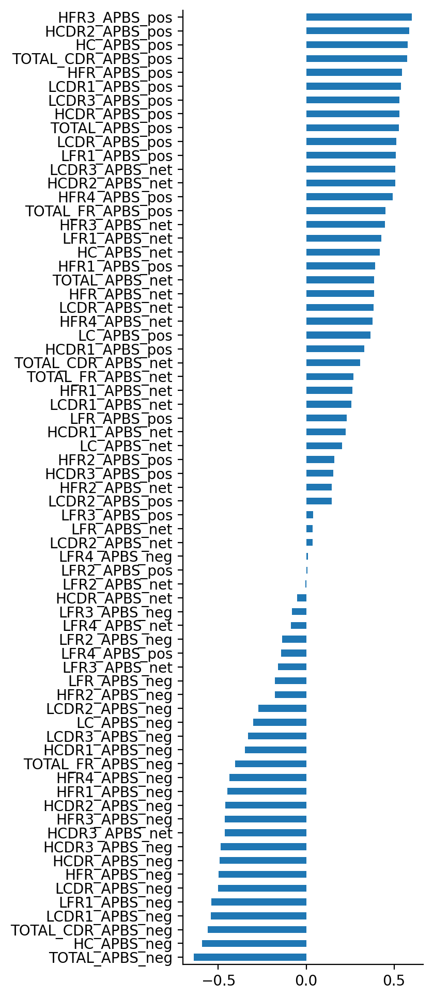

In [5]:
train.iloc[:,5:].abs().corr()['HeparinRRT_scaled'].iloc[1:].sort_values().plot(kind = 'barh', figsize = (3,12))
sns.despine()

### Set up feature sets

In [6]:
def has_number(s): 
    for c in s: 
        if c.isdigit():
            return True
        
    return False

feature_sets = {'positive_regions': [col for col in X.columns if col.endswith('pos') and has_number(col)],
                'negative_regions': [col for col in X.columns if col.endswith('neg') and has_number(col)],
                'net_regions': [col for col in X.columns if col.endswith('net') and has_number(col)], 
                'total_cdr_pos': [col for col in X.columns if not has_number(col) and col.endswith('pos') and col.startswith('TOTAL')],
                'total_cdr_neg': [col for col in X.columns if not has_number(col) and col.endswith('neg') and col.startswith('TOTAL')],
                'total_cdr_net': [col for col in X.columns if not has_number(col) and col.endswith('net') and col.startswith('TOTAL')],
                'all': X.columns
}

### Save the data again for using MLFlowExperiment class 

There are some outliers. I will remove them. 
They are below. Remove all points less than 0.8 and all greateer than 1.3

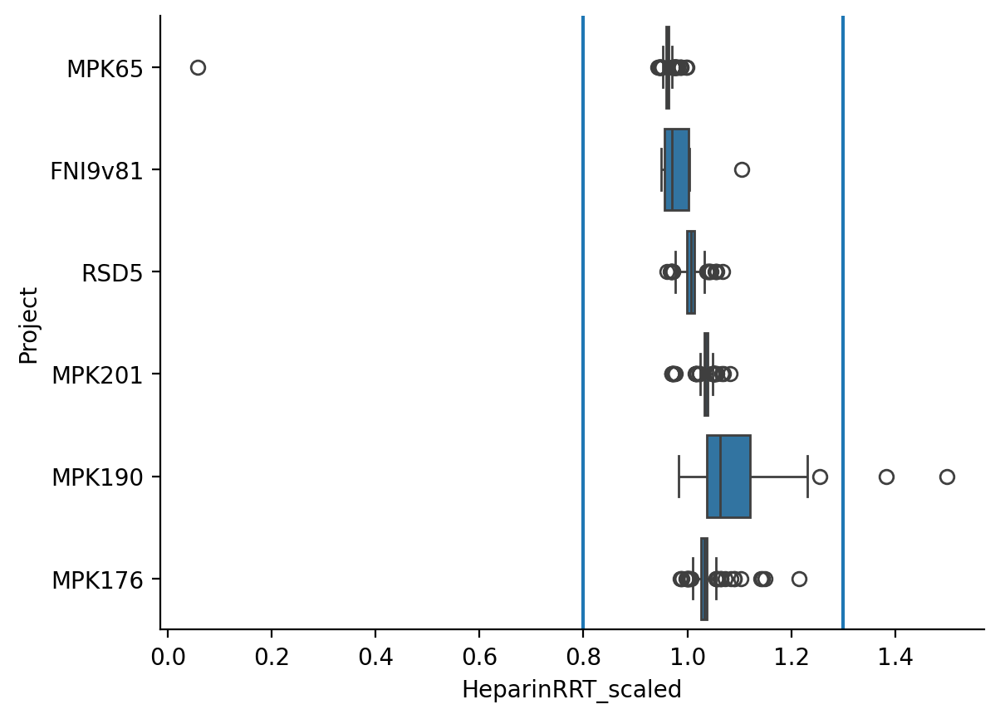

In [7]:
train = train.sort_values('HeparinRRT_scaled')
ax = sns.boxplot(train, x='HeparinRRT_scaled', y='Project')
ax.axvline(1.3)
ax.axvline(0.8)
sns.despine()



In [8]:
train = train.query('HeparinRRT_scaled>0.8 & HeparinRRT_scaled<1.3')
train['HeparinRRT_scaled'].describe()

count    715.000000
mean       1.026569
std        0.051959
min        0.943630
25%        0.997301
50%        1.030125
75%        1.047398
max        1.255272
Name: HeparinRRT_scaled, dtype: float64

#### Save a training dataset. 

In [9]:
training_path = data_path / 'train'
if not training_path.exists():
    training_path.mkdir()

train_filename = training_path/f'train_{today}.parquet'
train[y.columns.tolist() + X.columns.tolist()].to_parquet(train_filename)


In [10]:
tracking_uri = 'http://127.0.0.1:5000'

experiment = MLFlowExperiment(train_filename,
                              target='HeparinRRT_scaled', 
                              experiment_name='MultipleParentalAntibodyRegressionExp1', 
                              regression=True, 
                              feature_sets = feature_sets, 
                              tracking_uri=tracking_uri)

2024/04/26 19:50:50 INFO mlflow.tracking.fluent: Experiment with name 'MultipleParentalAntibodyRegressionExp1' does not exist. Creating a new experiment.


  0%|          | 0/7 [00:00<?, ?it/s]

Fitting 50 folds for each of 9 candidates, totalling 450 fits
Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa

Fitting 50 folds for each of 99 candidates, totalling 4950 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.557e-01, tolerance: 1.569e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.527e-01, tolerance: 1.522e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using

Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
 14%|█▍        | 1/7 [02:00<12:03, 120.62s/it]

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa

Fitting 50 folds for each of 99 candidates, totalling 4950 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.876e-01, tolerance: 1.522e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.014e-01, tolerance: 1.569e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using

Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
 29%|██▊       | 2/7 [04:02<10:05, 121.09s/it]

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/projects/developability/developability/modeling.py:128: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=(8, 6))
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa

Fitting 50 folds for each of 99 candidates, totalling 4950 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.720e-01, tolerance: 1.569e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.698e-01, tolerance: 1.485e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using

Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
 43%|████▎     | 3/7 [06:01<08:01, 120.49s/it]

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa

Fitting 50 folds for each of 99 candidates, totalling 4950 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.598e-01, tolerance: 1.569e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.397e-01, tolerance: 1.462e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using

Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
 57%|█████▋    | 4/7 [08:00<05:59, 119.79s/it]

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa

Fitting 50 folds for each of 99 candidates, totalling 4950 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.417e-01, tolerance: 1.569e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.013e-01, tolerance: 1.462e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using

Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
 71%|███████▏  | 5/7 [09:55<03:55, 117.96s/it]

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa

Fitting 50 folds for each of 99 candidates, totalling 4950 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.781e-01, tolerance: 1.569e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.505e-01, tolerance: 1.462e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using

Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
 86%|████████▌ | 6/7 [11:54<01:58, 118.41s/it]

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.447e-04, tolerance: 1.928e-04
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.028e-04, tolerance: 1.496e-04
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features

Fitting 50 folds for each of 99 candidates, totalling 4950 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.989e-01, tolerance: 1.605e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.776e-01, tolerance: 1.559e-04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using

Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Fitting 50 folds for each of 24 candidates, totalling 1200 fits


/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/home/crivera/miniforge3/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
100%|██████████| 7/7 [14:01<00:00, 120.16s/it]


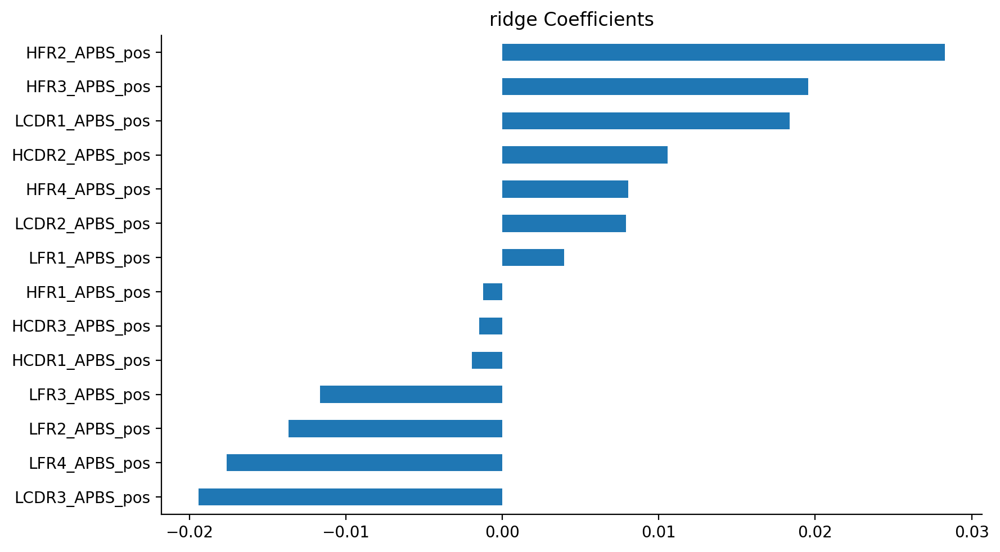

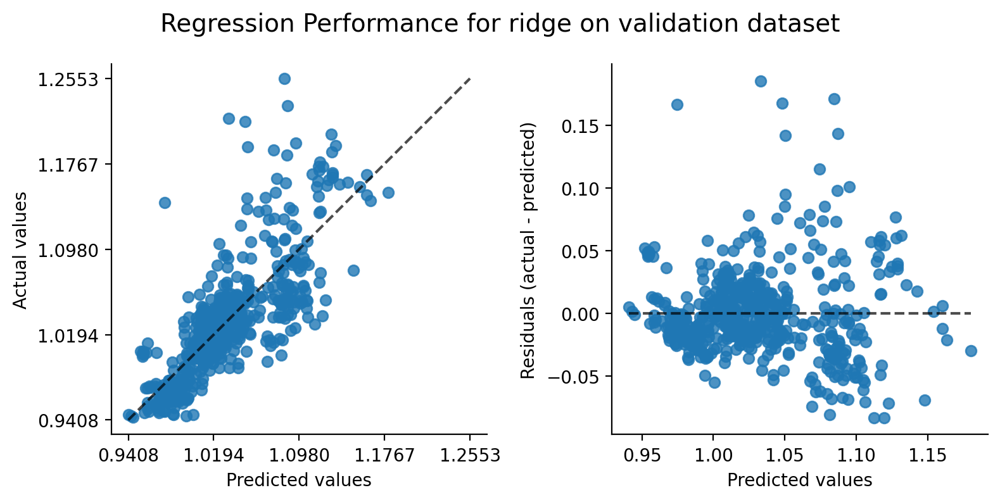

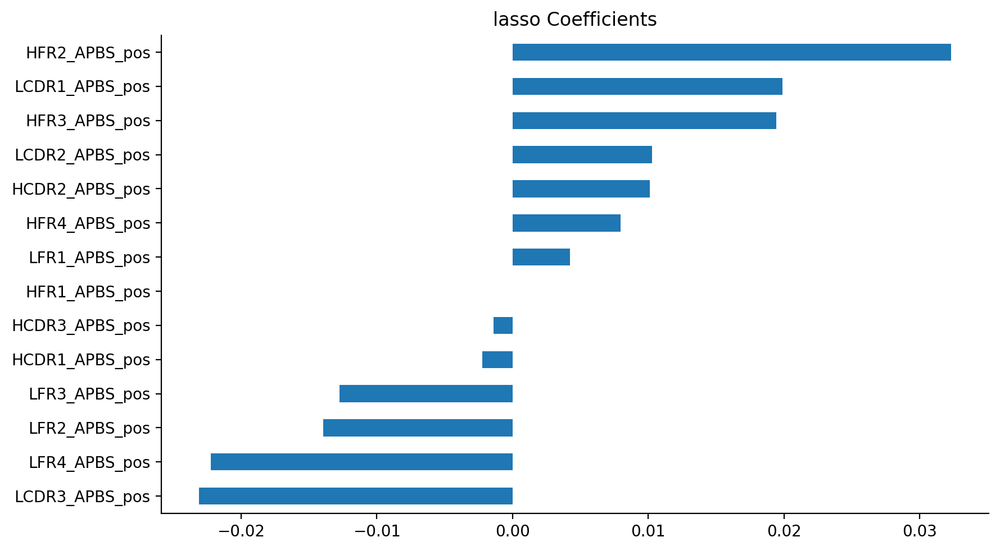

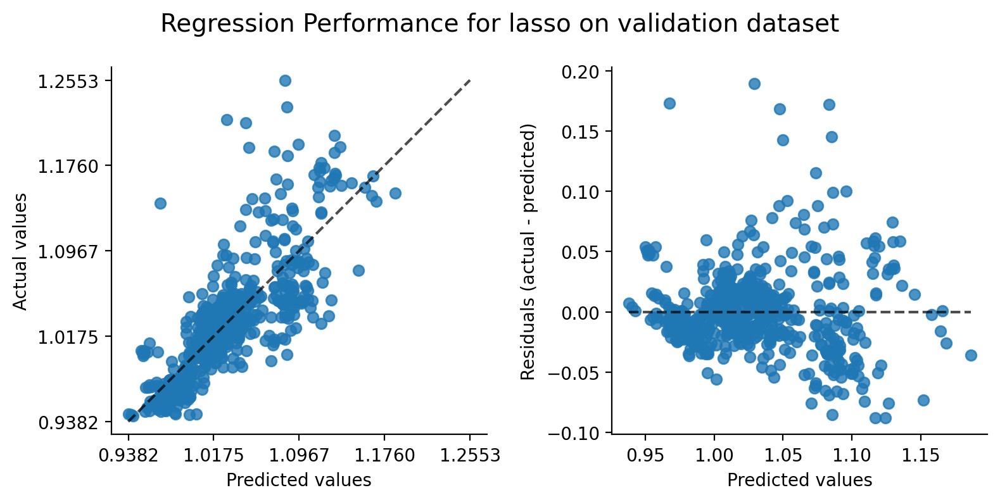

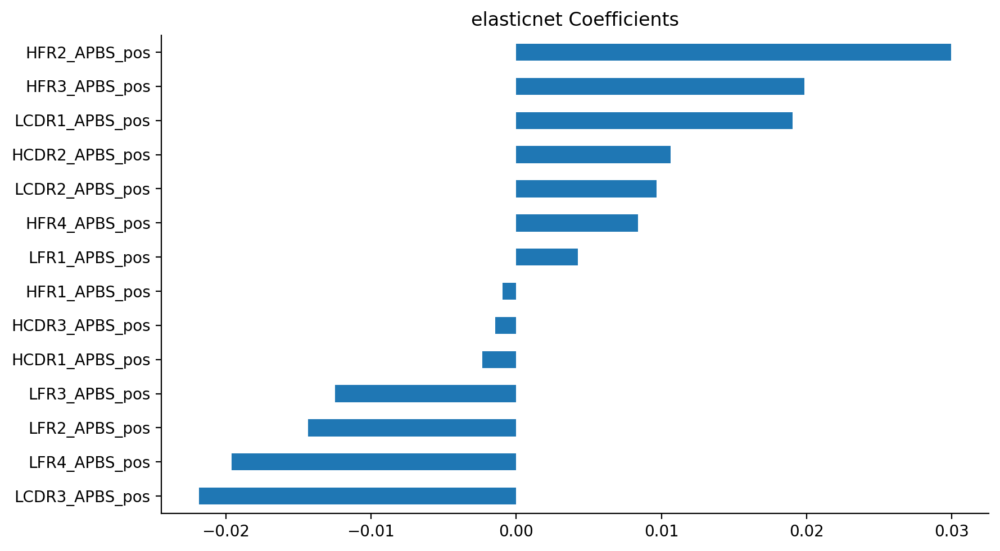

...

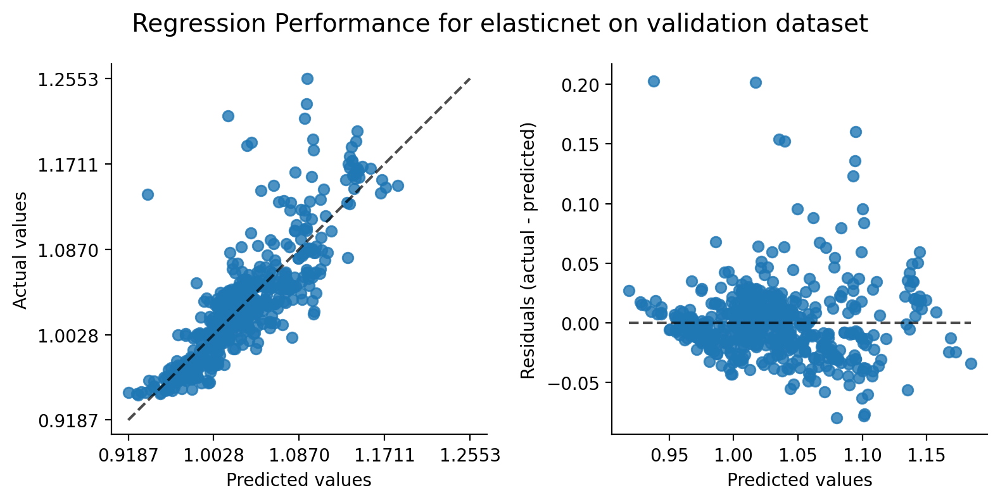

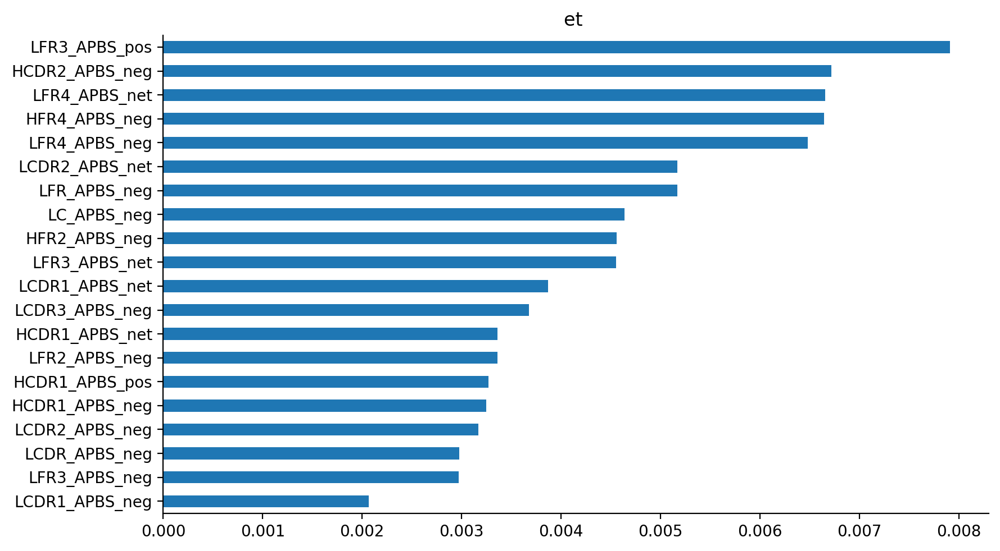

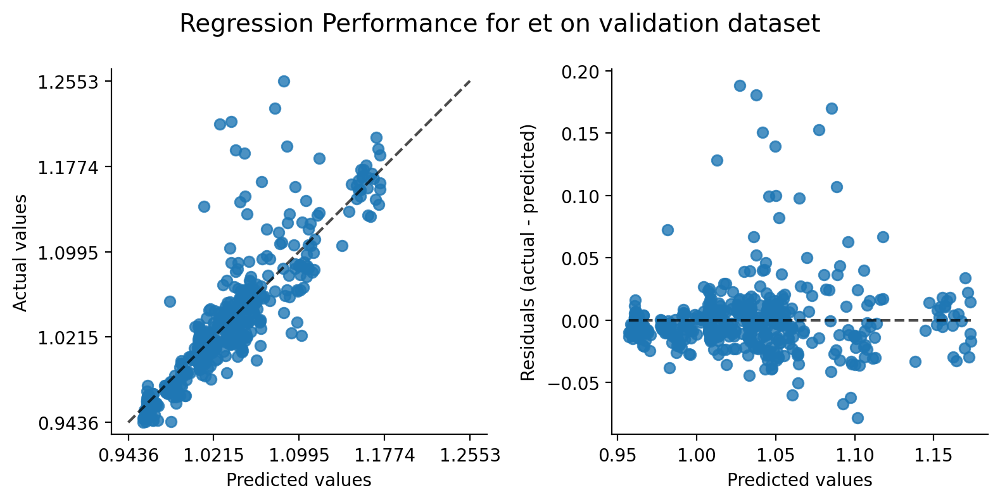

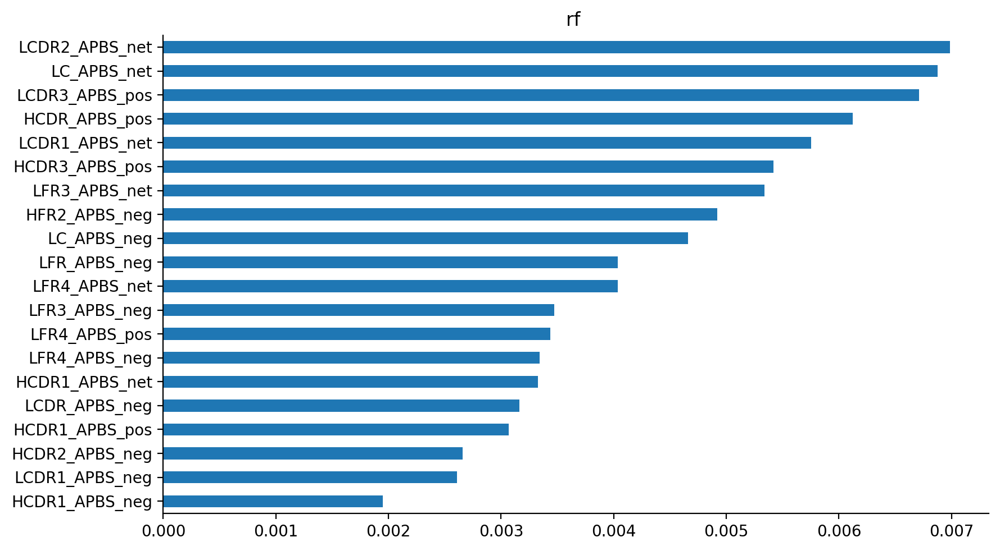

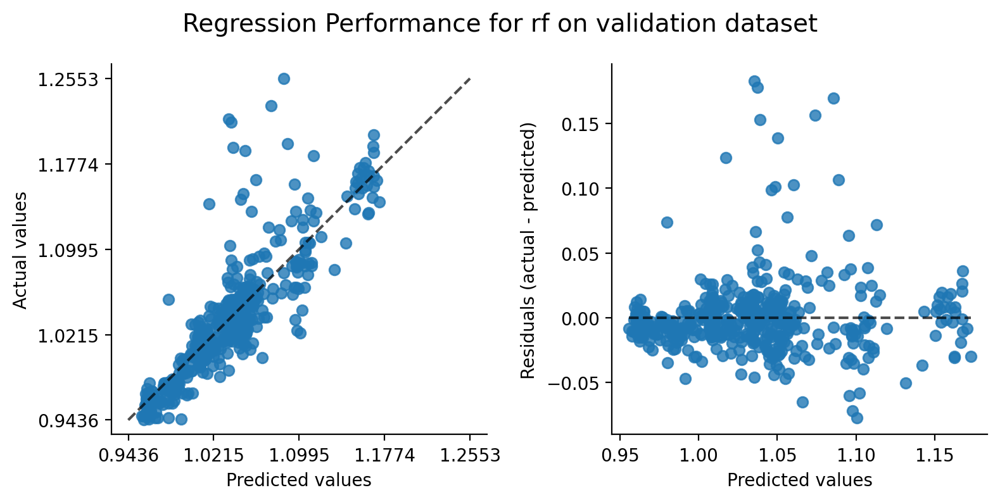

In [11]:
experiment.train_models()

### Remarks: 
I trained regression models to predict Heparin RRT on multiple antibodies. I will analyze it in more detail in another notebook. 